# Analysis of  Weather radar Storm  tracking  from 01 nov to 30 November 2021  with Jupyter Python

## Tasks <br/>

1.  Radar Data Visualization <br/>
2.  Radar Basic Statistic Values <br/>
3.  Radar Best Fit Distribution <br/>
4.  Probability for number of days <br/>
5.  Finding sequence of days <br/>


## Tutorial <br/>

 by NIZIMANA RWAKAGEYO Valens
    Data Scientist /Radar Data Processing Office 
    Meteo Rwanda
    


In [269]:
import scipy.stats
import matplotlib.pyplot as plt
plt.style.use("bmh")
import numpy as np

In [270]:
import pandas as pd
import csv
# To visualizae adata
import matplotlib.pyplot as plt
import pandas as pd
import bqplot.pyplot as plt
#import matplotlib.pyplotmatplotlib.pyplot
from pandas.plotting import table
import pandas as pd
import missingno as msno
import scipy as sp


In [271]:
#The following storms tracking  data sets from weather radar shows storms properties tracked on 01 to 30 November 2021 from  maranyundo weather radar . The radar is located at the origin of the plot. The image shows radar reflectivity, in units of dBZ, which is a measure of power reflected back to the radar by the water drops in a cloud. The higher the reflectivity the more severe the weather phenomenon. A dBZ value of 
# 30 indicates light rain or drizzle, 40 dBZ indicates moderate rain and 50 dBZ heavy rain. 
#At values above 50 dBZ hail is likely.

storms=pd.read_csv("C:/Users/METEO/Desktop/datasets/radardata/01_30november2021_storm_output_1.csv")
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
storms

C:\Users\METEO\AppData\Local\Temp/ipykernel_15492/2845009036.py:9: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,Track_num,Year,Month,Day,Hour,Min,Sec,Nscans,Duration(hours),RemDurAtMaxVol(hours),MeanVolume(km3),MaxVolume(km3),MeanMass(ktons),MaxMass(ktons),MaxPrecipDepthEllipse(mm),MeanPrecipDepthEllipse(mm),MeanPrecipDepthRuns(mm),MeanPrecipFlux(m3/s),MaxPrecipFlux(m3/s),MeanEnvelopeArea(km2),MaxEnvelopeArea(km2),MeanPrecipArea(km2),MaxPrecipArea(km2),MeanTop(kmMsl),MaxTop(kmMsl),MeanBase(kmMsl),MaxBase(kmMsl),MeanDBZ,MaxDBZ,RadarEstRainVol(m3),ATI(km2hr),SwathAreaEllipse(km2),SwathAreaRuns(km2),MeanSpeed(km/hr),MeanDirection(degT),POD,FAR,CSI,minRange(km),maxRange(km),meanRange(km)
0,4,2021,11,1.0,7.0,55.0,31.0,4.0,0.330000,-454376.0,33.7188,37.875,33.6711,47.0353,31.90810,6.53581,0.0,170.7500,260.1580,19.7500,22.75,19.7500,22.75,5.37500,5.75,2.25000,2.25,43.9015,55.35,245880.0,6.51750,43.75,0.0,2.989120,236.86200,0.0,1.0,0.0,56.51260,59.52120,58.23380
1,5,2021,11,1.0,8.0,5.0,3.0,4.0,0.342500,-454376.0,73.4375,89.625,70.4152,122.7130,31.25670,6.89180,0.0,396.1610,651.9770,47.0625,55.50,47.0625,55.50,5.62500,6.25,2.25000,2.25,43.2831,58.53,570472.0,16.11890,83.25,0.0,6.172540,289.87400,0.0,1.0,0.0,46.57020,47.68610,47.16540
2,8,2021,11,1.0,8.0,20.0,28.0,6.0,0.496944,-454377.0,55.5000,77.250,35.5016,52.3843,8.94846,3.05882,0.0,131.7750,188.1860,28.3750,43.00,28.3750,43.00,5.50000,5.75,2.25000,2.25,40.1744,50.07,284635.0,14.10080,93.25,0.0,14.382100,278.31500,0.0,1.0,0.0,82.08400,86.05050,83.86700
3,10,2021,11,1.0,8.0,25.0,13.0,4.0,0.328056,-454376.0,60.6562,98.250,61.5614,103.7370,20.39620,4.86830,0.0,274.4590,474.9610,31.3750,50.25,31.3750,50.25,5.87500,6.75,2.25000,2.25,44.0393,55.89,395220.0,10.29270,86.25,0.0,11.327100,210.11100,0.0,1.0,0.0,76.46650,80.96700,78.53300
4,12,2021,11,1.0,8.0,30.0,31.0,43.0,3.583060,-454379.0,148.9640,509.750,142.8040,461.6650,46.81770,9.79151,0.0,730.5470,2423.3300,88.5026,319.50,88.3699,319.50,6.20918,9.75,2.25000,2.25,43.3933,60.67,25800000.0,316.63400,2445.25,0.0,15.761000,252.87400,0.0,1.0,0.0,12.47150,64.55500,42.01470
5,27,2021,11,1.0,9.0,0.0,11.0,3.0,0.251667,-454377.0,37.4167,40.750,38.0416,49.7398,20.39620,5.32469,0.0,159.6090,212.6450,20.0000,22.00,20.0000,22.00,5.25000,5.25,2.25000,2.25,43.6117,54.84,172378.0,5.03333,38.00,0.0,3.428340,272.08400,0.0,1.0,0.0,78.35190,78.83920,78.60100
6,28,2021,11,1.0,9.0,0.0,11.0,12.0,1.003060,-454377.0,54.9028,90.875,46.8545,123.4350,19.42860,4.24635,0.0,226.3480,651.6240,34.8750,57.75,34.8750,57.75,5.13889,5.75,2.25000,2.25,42.3170,56.15,1470000.0,34.98160,358.25,0.0,22.430000,275.61700,0.0,1.0,0.0,62.17950,82.12810,71.69530
7,32,2021,11,1.0,9.0,10.0,15.0,4.0,0.330000,-454377.0,43.0938,48.750,35.5977,42.2159,19.80900,4.51940,0.0,152.7370,203.1120,23.8125,30.00,23.8125,30.00,5.50000,5.75,2.25000,2.25,42.3547,53.44,219942.0,7.85813,52.50,0.0,6.046790,224.85800,0.0,1.0,0.0,73.52800,74.43900,73.90590
8,34,2021,11,1.0,9.0,15.0,0.0,3.0,0.252500,-454377.0,44.4167,52.625,40.1828,50.2872,27.47810,6.32547,0.0,192.2650,230.2280,24.5833,27.25,24.5833,27.25,6.25000,6.25,2.25000,2.25,43.1424,53.79,207647.0,6.20729,37.00,0.0,3.260580,270.47700,0.0,1.0,0.0,30.30650,30.80570,30.57270
9,35,2021,11,1.0,9.0,15.0,0.0,5.0,0.420556,-454377.0,46.9000,64.375,50.6703,82.5885,19.41310,5.50567,0.0,242.6240,379.8930,25.8000,36.25,25.8000,36.25,4.95000,5.25,2.25000,2.25,44.4192,58.00,436723.0,10.85030,87.50,0.0,10.077900,200.83200,0.0,1.0,0.0,63.47960,68.43180,66.01990


In [368]:
storms.dropna()

,Year,Month,Day,Hour,Min,Sec,Nscans,Duration(hours),RemDurAtMaxVol(hours),MeanVolume(km3),MaxVolume(km3),MeanMass(ktons),MaxMass(ktons),MaxPrecipDepthEllipse(mm),MeanPrecipDepthEllipse(mm),MeanPrecipDepthRuns(mm),MeanPrecipFlux(m3/s),MaxPrecipFlux(m3/s),MeanEnvelopeArea(km2),MaxEnvelopeArea(km2),MeanPrecipArea(km2),MaxPrecipArea(km2),MeanTop(kmMsl),MaxTop(kmMsl),MeanBase(kmMsl),MaxBase(kmMsl),MeanDBZ,MaxDBZ,RadarEstRainVol(m3),ATI(km2hr),SwathAreaEllipse(km2),SwathAreaRuns(km2),MeanSpeed(km/hr),MeanDirection(degT),POD,FAR,CSI,minRange(km),maxRange(km),meanRange(km)
0,2021,10,10.0,11.0,40.0,14.0,4.0,0.328611,-453852.0,54.5938,78.250,40.6447,55.9236,7.16081,2.08647,0.0,131.7070,185.4500,23.9375,34.50,23.9375,34.50,5.12500,5.25,2.25000,2.25,41.2253,50.57,189658.0,7.86613,95.50,0.0,19.403700,32.61290,0.0,1.0,0.0,100.31700,107.0670,104.03800
1,2021,10,10.0,11.0,55.0,1.0,4.0,0.341111,-453852.0,56.5000,71.375,70.0940,109.7660,37.30650,9.12064,0.0,339.3100,546.5730,29.0000,37.75,29.0000,37.75,6.00000,6.75,2.25000,2.25,44.6836,58.74,488607.0,9.89222,53.00,0.0,2.675420,259.12000,0.0,1.0,0.0,78.11940,79.7506,78.96190
2,2021,10,10.0,11.0,55.0,1.0,3.0,0.251389,-453852.0,65.2917,92.875,44.6402,71.2088,7.22498,2.48841,0.0,119.2380,196.2970,26.5000,38.00,26.5000,38.00,5.25000,5.25,2.25000,2.25,39.9755,49.32,128777.0,6.66181,54.25,0.0,8.924400,296.14100,0.0,1.0,0.0,111.56700,113.4530,112.50500
3,2021,10,10.0,11.0,55.0,1.0,3.0,0.251389,-453852.0,124.4170,132.000,107.9460,115.4350,11.61510,3.00944,0.0,304.2650,316.3240,50.6667,56.50,50.6667,56.50,5.25000,5.25,2.25000,2.25,42.6754,51.99,328606.0,12.73700,108.25,0.0,10.239100,321.03600,0.0,1.0,0.0,108.12700,110.4950,109.29400
4,2021,10,10.0,12.0,10.0,22.0,5.0,0.418333,-453852.0,88.6000,151.875,126.0690,245.2290,30.28780,6.95712,0.0,452.5760,892.7800,39.7500,66.25,39.7500,66.25,4.75000,4.75,2.25000,2.25,46.2418,58.95,814637.0,16.62880,114.75,0.0,9.971130,280.12100,0.0,1.0,0.0,98.06070,103.2810,100.20300
5,2021,10,10.0,12.0,15.0,7.0,6.0,0.507778,-453852.0,56.5208,83.875,54.7427,97.9021,26.47080,6.00216,0.0,274.2950,568.5740,30.3333,41.00,30.3333,41.00,5.16667,5.25,2.25000,2.25,42.6670,59.02,592476.0,15.40260,94.50,0.0,13.610000,241.77700,0.0,1.0,0.0,69.34200,75.5935,71.94210
6,2021,10,10.0,12.0,20.0,25.0,3.0,0.250833,-453852.0,53.4583,80.750,49.6595,95.7109,11.65500,3.67594,0.0,166.0010,344.6020,23.7500,37.75,23.7500,37.75,5.08333,5.25,2.25000,2.25,42.0645,52.79,179281.0,5.95729,51.00,0.0,6.957560,112.08600,0.0,1.0,0.0,106.39800,106.8880,106.69400
7,2021,10,10.0,12.0,20.0,25.0,5.0,0.418333,-453852.0,89.8250,125.625,113.0400,177.2700,34.71780,7.03588,0.0,338.6940,511.5770,38.0500,54.00,38.0500,54.00,5.05000,5.25,2.25000,2.25,45.2227,55.00,609649.0,15.91760,91.50,0.0,2.668090,255.93500,0.0,1.0,0.0,104.87800,107.1080,106.14300
8,2021,10,10.0,12.0,20.0,25.0,6.0,0.496389,-453853.0,57.5417,70.625,51.6451,86.4980,22.51550,4.78049,0.0,134.4020,227.0520,21.2500,26.50,21.2500,26.50,5.25000,5.25,2.25000,2.25,42.0786,56.83,290307.0,10.54830,67.00,0.0,14.083400,300.71000,0.0,1.0,0.0,110.42900,112.0530,111.12800
9,2021,10,10.0,12.0,25.0,9.0,5.0,0.418333,-453853.0,56.4250,84.750,37.0882,53.5925,11.05270,2.61565,0.0,107.7070,149.1610,25.3500,34.00,25.3500,34.00,5.95000,6.25,2.75000,2.75,40.2726,48.70,193872.0,10.60480,81.00,0.0,16.493900,308.37900,0.0,1.0,0.0,127.24900,129.2560,128.53500


In [369]:
storms.head()

,Year,Month,Day,Hour,Min,Sec,Nscans,Duration(hours),RemDurAtMaxVol(hours),MeanVolume(km3),MaxVolume(km3),MeanMass(ktons),MaxMass(ktons),MaxPrecipDepthEllipse(mm),MeanPrecipDepthEllipse(mm),MeanPrecipDepthRuns(mm),MeanPrecipFlux(m3/s),MaxPrecipFlux(m3/s),MeanEnvelopeArea(km2),MaxEnvelopeArea(km2),MeanPrecipArea(km2),MaxPrecipArea(km2),MeanTop(kmMsl),MaxTop(kmMsl),MeanBase(kmMsl),MaxBase(kmMsl),MeanDBZ,MaxDBZ,RadarEstRainVol(m3),ATI(km2hr),SwathAreaEllipse(km2),SwathAreaRuns(km2),MeanSpeed(km/hr),MeanDirection(degT),POD,FAR,CSI,minRange(km),maxRange(km),meanRange(km)
0,2021,10,10.0,11.0,40.0,14.0,4.0,0.328611,-453852.0,54.5938,78.250,40.6447,55.9236,7.16081,2.08647,0.0,131.707,185.450,23.9375,34.50,23.9375,34.50,5.125,5.25,2.25,2.25,41.2253,50.57,189658.0,7.86613,95.50,0.0,19.40370,32.6129,0.0,1.0,0.0,100.3170,107.0670,104.0380
1,2021,10,10.0,11.0,55.0,1.0,4.0,0.341111,-453852.0,56.5000,71.375,70.0940,109.7660,37.30650,9.12064,0.0,339.310,546.573,29.0000,37.75,29.0000,37.75,6.000,6.75,2.25,2.25,44.6836,58.74,488607.0,9.89222,53.00,0.0,2.67542,259.1200,0.0,1.0,0.0,78.1194,79.7506,78.9619
2,2021,10,10.0,11.0,55.0,1.0,3.0,0.251389,-453852.0,65.2917,92.875,44.6402,71.2088,7.22498,2.48841,0.0,119.238,196.297,26.5000,38.00,26.5000,38.00,5.250,5.25,2.25,2.25,39.9755,49.32,128777.0,6.66181,54.25,0.0,8.92440,296.1410,0.0,1.0,0.0,111.5670,113.4530,112.5050
3,2021,10,10.0,11.0,55.0,1.0,3.0,0.251389,-453852.0,124.4170,132.000,107.9460,115.4350,11.61510,3.00944,0.0,304.265,316.324,50.6667,56.50,50.6667,56.50,5.250,5.25,2.25,2.25,42.6754,51.99,328606.0,12.73700,108.25,0.0,10.23910,321.0360,0.0,1.0,0.0,108.1270,110.4950,109.2940
4,2021,10,10.0,12.0,10.0,22.0,5.0,0.418333,-453852.0,88.6000,151.875,126.0690,245.2290,30.28780,6.95712,0.0,452.576,892.780,39.7500,66.25,39.7500,66.25,4.750,4.75,2.25,2.25,46.2418,58.95,814637.0,16.62880,114.75,0.0,9.97113,280.1210,0.0,1.0,0.0,98.0607,103.2810,100.2030


In [370]:
#The columns field of the dataframe provides access to the names of the columns.
#It is good practice to run a few checks on your data, 
#to make sure that you understand how the columns are encoded and to check things look sensible.
#A simple way of writing such checks in Python is to use the assert function to write a few assertions. 
#If an assertion fails, Python will print an error.
storms.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Min', 'Sec', 'Nscans',
       'Duration(hours)', 'RemDurAtMaxVol(hours)', 'MeanVolume(km3)',
       'MaxVolume(km3)', 'MeanMass(ktons)', 'MaxMass(ktons)',
       'MaxPrecipDepthEllipse(mm)', 'MeanPrecipDepthEllipse(mm)',
       'MeanPrecipDepthRuns(mm)', 'MeanPrecipFlux(m3/s)',
       'MaxPrecipFlux(m3/s)', 'MeanEnvelopeArea(km2)', 'MaxEnvelopeArea(km2)',
       'MeanPrecipArea(km2)', 'MaxPrecipArea(km2)', 'MeanTop(kmMsl)',
       'MaxTop(kmMsl)', 'MeanBase(kmMsl)', 'MaxBase(kmMsl)', 'MeanDBZ',
       'MaxDBZ', 'RadarEstRainVol(m3)', 'ATI(km2hr)', 'SwathAreaEllipse(km2)',
       'SwathAreaRuns(km2)', 'MeanSpeed(km/hr)', 'MeanDirection(degT)', 'POD',
       'FAR', 'CSI', 'minRange(km)', 'maxRange(km)', 'meanRange(km)'],
      dtype='object')

In [396]:
#Data consistency checks
#Let's look at how the meanDBZ  changed over the HOUR.

plt.plot(storms["MeanDBZ"])
plt.ylabel("Mean daily temperature (°C)")

In [373]:
storms.max()

Year                          n_total   
Month                         :         
Day                           887.0     
Hour                          23.0      
Min                           55.0      
Sec                           35.0      
Nscans                        46.0      
Duration(hours)               3.84083   
RemDurAtMaxVol(hours)         0.0       
MeanVolume(km3)               258.199   
MaxVolume(km3)                799.625   
MeanMass(ktons)               261.704   
MaxMass(ktons)                829.446   
MaxPrecipDepthEllipse(mm)     92.3017   
MeanPrecipDepthEllipse(mm)    17.0317   
MeanPrecipDepthRuns(mm)       0.0       
MeanPrecipFlux(m3/s)          1489.79   
MaxPrecipFlux(m3/s)           4342.48   
MeanEnvelopeArea(km2)         147.571   
MaxEnvelopeArea(km2)          499.0     
MeanPrecipArea(km2)           147.357   
MaxPrecipArea(km2)            497.5     
MeanTop(kmMsl)                7.46429   
MaxTop(kmMsl)                 12.75     
MeanBase(kmMsl) 

In [374]:
storms.max()

Year                          n_total   
Month                         :         
Day                           887.0     
Hour                          23.0      
Min                           55.0      
Sec                           35.0      
Nscans                        46.0      
Duration(hours)               3.84083   
RemDurAtMaxVol(hours)         0.0       
MeanVolume(km3)               258.199   
MaxVolume(km3)                799.625   
MeanMass(ktons)               261.704   
MaxMass(ktons)                829.446   
MaxPrecipDepthEllipse(mm)     92.3017   
MeanPrecipDepthEllipse(mm)    17.0317   
MeanPrecipDepthRuns(mm)       0.0       
MeanPrecipFlux(m3/s)          1489.79   
MaxPrecipFlux(m3/s)           4342.48   
MeanEnvelopeArea(km2)         147.571   
MaxEnvelopeArea(km2)          499.0     
MeanPrecipArea(km2)           147.357   
MaxPrecipArea(km2)            497.5     
MeanTop(kmMsl)                7.46429   
MaxTop(kmMsl)                 12.75     
MeanBase(kmMsl) 

In [375]:
stormsdf = storms[storms.isnull().any(axis=1)]
##print (stormsdf.isna())
#Non value column and Rows
stormsdf.loc[:, stormsdf.isna().any()]

,Day,Hour,Min,Sec,Nscans,Duration(hours),RemDurAtMaxVol(hours),MeanVolume(km3),MaxVolume(km3),MeanMass(ktons),MaxMass(ktons),MaxPrecipDepthEllipse(mm),MeanPrecipDepthEllipse(mm),MeanPrecipDepthRuns(mm),MeanPrecipFlux(m3/s),MaxPrecipFlux(m3/s),MeanEnvelopeArea(km2),MaxEnvelopeArea(km2),MeanPrecipArea(km2),MaxPrecipArea(km2),MeanTop(kmMsl),MaxTop(kmMsl),MeanBase(kmMsl),MaxBase(kmMsl),MeanDBZ,MaxDBZ,RadarEstRainVol(m3),ATI(km2hr),SwathAreaEllipse(km2),SwathAreaRuns(km2),MeanSpeed(km/hr),MeanDirection(degT),POD,FAR,CSI,minRange(km),maxRange(km),meanRange(km)
887,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
888,726.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
889,887.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [376]:
### Count of null values in each column of the data sets.
stormsdf.isnull().sum()

Year                          0
Month                         0
Day                           1
Hour                          3
Min                           3
Sec                           3
Nscans                        3
Duration(hours)               3
RemDurAtMaxVol(hours)         3
MeanVolume(km3)               3
MaxVolume(km3)                3
MeanMass(ktons)               3
MaxMass(ktons)                3
MaxPrecipDepthEllipse(mm)     3
MeanPrecipDepthEllipse(mm)    3
MeanPrecipDepthRuns(mm)       3
MeanPrecipFlux(m3/s)          3
MaxPrecipFlux(m3/s)           3
MeanEnvelopeArea(km2)         3
MaxEnvelopeArea(km2)          3
MeanPrecipArea(km2)           3
MaxPrecipArea(km2)            3
MeanTop(kmMsl)                3
MaxTop(kmMsl)                 3
MeanBase(kmMsl)               3
MaxBase(kmMsl)                3
MeanDBZ                       3
MaxDBZ                        3
RadarEstRainVol(m3)           3
ATI(km2hr)                    3
SwathAreaEllipse(km2)         3
SwathAre

<AxesSubplot:>

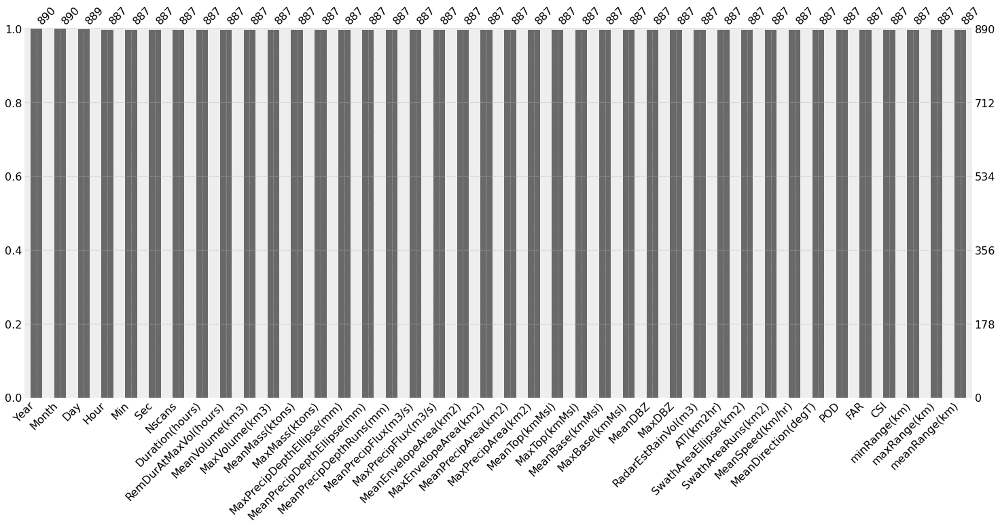

In [377]:
  
# Visualize missing  values as a matrix
msno.bar(storms)

In [378]:
storms.head(233)

,Year,Month,Day,Hour,Min,Sec,Nscans,Duration(hours),RemDurAtMaxVol(hours),MeanVolume(km3),MaxVolume(km3),MeanMass(ktons),MaxMass(ktons),MaxPrecipDepthEllipse(mm),MeanPrecipDepthEllipse(mm),MeanPrecipDepthRuns(mm),MeanPrecipFlux(m3/s),MaxPrecipFlux(m3/s),MeanEnvelopeArea(km2),MaxEnvelopeArea(km2),MeanPrecipArea(km2),MaxPrecipArea(km2),MeanTop(kmMsl),MaxTop(kmMsl),MeanBase(kmMsl),MaxBase(kmMsl),MeanDBZ,MaxDBZ,RadarEstRainVol(m3),ATI(km2hr),SwathAreaEllipse(km2),SwathAreaRuns(km2),MeanSpeed(km/hr),MeanDirection(degT),POD,FAR,CSI,minRange(km),maxRange(km),meanRange(km)
0,2021,10,10.0,11.0,40.0,14.0,4.0,0.328611,-453852.0,54.5938,78.250,40.6447,55.9236,7.16081,2.08647,0.0,131.7070,185.4500,23.9375,34.50,23.9375,34.50,5.12500,5.25,2.25000,2.25,41.2253,50.57,189658.0,7.86613,95.50,0.0,19.40370,32.6129,0.0,1.0,0.0,100.31700,107.0670,104.0380
1,2021,10,10.0,11.0,55.0,1.0,4.0,0.341111,-453852.0,56.5000,71.375,70.0940,109.7660,37.30650,9.12064,0.0,339.3100,546.5730,29.0000,37.75,29.0000,37.75,6.00000,6.75,2.25000,2.25,44.6836,58.74,488607.0,9.89222,53.00,0.0,2.67542,259.1200,0.0,1.0,0.0,78.11940,79.7506,78.9619
2,2021,10,10.0,11.0,55.0,1.0,3.0,0.251389,-453852.0,65.2917,92.875,44.6402,71.2088,7.22498,2.48841,0.0,119.2380,196.2970,26.5000,38.00,26.5000,38.00,5.25000,5.25,2.25000,2.25,39.9755,49.32,128777.0,6.66181,54.25,0.0,8.92440,296.1410,0.0,1.0,0.0,111.56700,113.4530,112.5050
3,2021,10,10.0,11.0,55.0,1.0,3.0,0.251389,-453852.0,124.4170,132.000,107.9460,115.4350,11.61510,3.00944,0.0,304.2650,316.3240,50.6667,56.50,50.6667,56.50,5.25000,5.25,2.25000,2.25,42.6754,51.99,328606.0,12.73700,108.25,0.0,10.23910,321.0360,0.0,1.0,0.0,108.12700,110.4950,109.2940
4,2021,10,10.0,12.0,10.0,22.0,5.0,0.418333,-453852.0,88.6000,151.875,126.0690,245.2290,30.28780,6.95712,0.0,452.5760,892.7800,39.7500,66.25,39.7500,66.25,4.75000,4.75,2.25000,2.25,46.2418,58.95,814637.0,16.62880,114.75,0.0,9.97113,280.1210,0.0,1.0,0.0,98.06070,103.2810,100.2030
5,2021,10,10.0,12.0,15.0,7.0,6.0,0.507778,-453852.0,56.5208,83.875,54.7427,97.9021,26.47080,6.00216,0.0,274.2950,568.5740,30.3333,41.00,30.3333,41.00,5.16667,5.25,2.25000,2.25,42.6670,59.02,592476.0,15.40260,94.50,0.0,13.61000,241.7770,0.0,1.0,0.0,69.34200,75.5935,71.9421
6,2021,10,10.0,12.0,20.0,25.0,3.0,0.250833,-453852.0,53.4583,80.750,49.6595,95.7109,11.65500,3.67594,0.0,166.0010,344.6020,23.7500,37.75,23.7500,37.75,5.08333,5.25,2.25000,2.25,42.0645,52.79,179281.0,5.95729,51.00,0.0,6.95756,112.0860,0.0,1.0,0.0,106.39800,106.8880,106.6940
7,2021,10,10.0,12.0,20.0,25.0,5.0,0.418333,-453852.0,89.8250,125.625,113.0400,177.2700,34.71780,7.03588,0.0,338.6940,511.5770,38.0500,54.00,38.0500,54.00,5.05000,5.25,2.25000,2.25,45.2227,55.00,609649.0,15.91760,91.50,0.0,2.66809,255.9350,0.0,1.0,0.0,104.87800,107.1080,106.1430
8,2021,10,10.0,12.0,20.0,25.0,6.0,0.496389,-453853.0,57.5417,70.625,51.6451,86.4980,22.51550,4.78049,0.0,134.4020,227.0520,21.2500,26.50,21.2500,26.50,5.25000,5.25,2.25000,2.25,42.0786,56.83,290307.0,10.54830,67.00,0.0,14.08340,300.7100,0.0,1.0,0.0,110.42900,112.0530,111.1280
9,2021,10,10.0,12.0,25.0,9.0,5.0,0.418333,-453853.0,56.4250,84.750,37.0882,53.5925,11.05270,2.61565,0.0,107.7070,149.1610,25.3500,34.00,25.3500,34.00,5.95000,6.25,2.75000,2.75,40.2726,48.70,193872.0,10.60480,81.00,0.0,16.49390,308.3790,0.0,1.0,0.0,127.24900,129.2560,128.5350


In [379]:
storms["MaxDBZ"]

0      50.57
1      58.74
2      49.32
3      51.99
4      58.95
5      59.02
6      52.79
7      55.00
8      56.83
9      48.70
10     55.60
11     56.26
12     44.02
13     49.57
14     54.02
15     58.07
16     54.06
17     54.41
18     48.25
19     60.65
20     58.54
21     58.10
22     57.72
23     59.13
24     62.15
25     56.53
26     54.36
27     53.79
28     56.65
29     55.30
30     58.88
31     56.19
32     58.53
33     52.06
34     57.05
35     49.15
36     58.74
37     51.14
38     54.86
39     60.84
40     52.89
41     55.82
42     52.14
43     54.43
44     54.95
45     49.41
46     46.51
47     59.19
48     50.86
49     46.91
50     53.43
51     53.31
52     58.16
53     61.86
54     60.01
55     54.74
56     60.50
57     60.79
58     50.25
59     50.08
60     56.52
61     51.99
62     58.51
63     54.26
64     51.44
65     50.80
66     51.73
67     53.83
68     58.32
69     60.74
70     58.71
71     47.89
72     52.68
73     56.21
74     55.47
75     51.16
76     49.32

<AxesSubplot:ylabel='Frequency'>

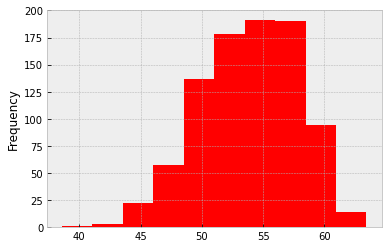

In [380]:
#November Maximum reflectivity  base of frequency 
storms["MaxDBZ"].plot(kind="hist" ,color="red")

In [381]:
### November storms mean  reflectivity 
storms["MeanDBZ"]

0      41.2253
1      44.6836
2      39.9755
3      42.6754
4      46.2418
5      42.6670
6      42.0645
7      45.2227
8      42.0786
9      40.2726
10     43.2097
11     43.6575
12     38.5850
13     42.7976
14     42.6008
15     43.9768
16     42.4886
17     44.2625
18     40.9950
19     44.2483
20     43.9181
21     42.6454
22     44.2666
23     44.0179
24     47.0843
25     44.4947
26     42.1729
27     41.3860
28     41.2178
29     42.4694
30     43.0689
31     42.5776
32     45.3474
33     42.0722
34     43.0751
35     41.4167
36     44.2292
37     40.5488
38     42.3566
39     43.5798
40     42.2291
41     43.7520
42     42.1414
43     42.0133
44     43.1514
45     41.6562
46     39.7630
47     44.0780
48     42.5569
49     39.4255
50     43.1440
51     42.6212
52     42.4169
53     44.2157
54     44.5593
55     43.4822
56     42.6370
57     43.8780
58     40.8473
59     40.6599
60     46.6395
61     43.3945
62     45.1238
63     43.5653
64     43.9846
65     41.7568
66     42.

<AxesSubplot:>

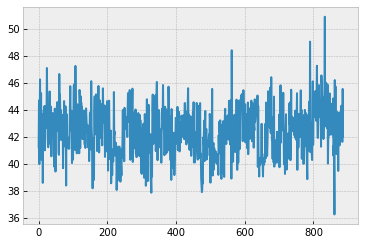

In [382]:

storms["MeanDBZ"].plot()

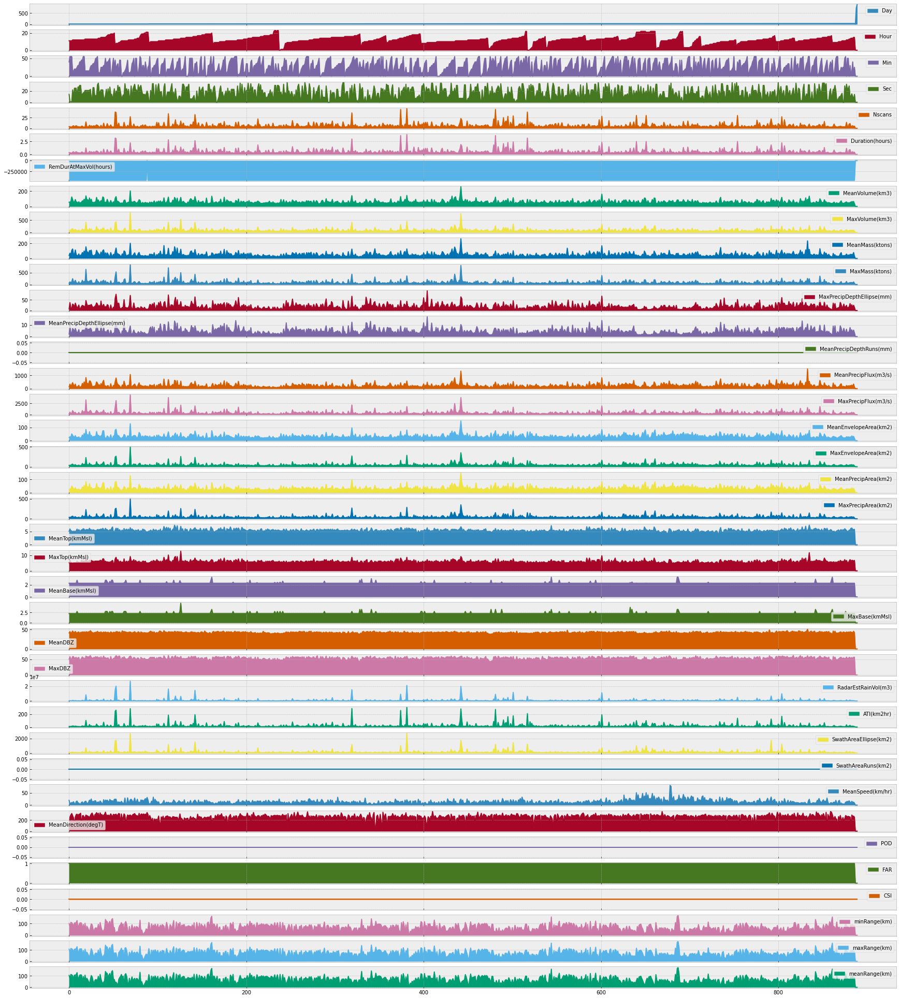

In [383]:
axs = storms.plot.area(figsize=(30, 35), subplots=True)

# axs = storms.plot.area(figsize=(15, 30), subplots=True)

In [384]:
#maximum REFLECTIVITY record by weather radar 
storms["MaxDBZ"]

0      50.57
1      58.74
2      49.32
3      51.99
4      58.95
5      59.02
6      52.79
7      55.00
8      56.83
9      48.70
10     55.60
11     56.26
12     44.02
13     49.57
14     54.02
15     58.07
16     54.06
17     54.41
18     48.25
19     60.65
20     58.54
21     58.10
22     57.72
23     59.13
24     62.15
25     56.53
26     54.36
27     53.79
28     56.65
29     55.30
30     58.88
31     56.19
32     58.53
33     52.06
34     57.05
35     49.15
36     58.74
37     51.14
38     54.86
39     60.84
40     52.89
41     55.82
42     52.14
43     54.43
44     54.95
45     49.41
46     46.51
47     59.19
48     50.86
49     46.91
50     53.43
51     53.31
52     58.16
53     61.86
54     60.01
55     54.74
56     60.50
57     60.79
58     50.25
59     50.08
60     56.52
61     51.99
62     58.51
63     54.26
64     51.44
65     50.80
66     51.73
67     53.83
68     58.32
69     60.74
70     58.71
71     47.89
72     52.68
73     56.21
74     55.47
75     51.16
76     49.32

<AxesSubplot:ylabel='Frequency'>

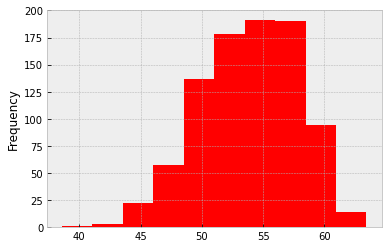

In [385]:
##Maximu Reflectivity  recorded by radar  on December 2021
storms["MaxDBZ"].plot(kind="hist",color="red")

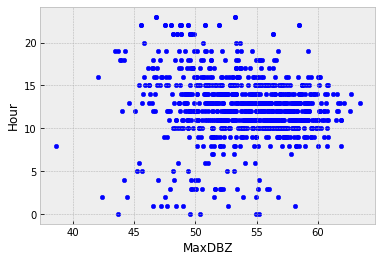

In [386]:
#The scatter plot for Max Dbz compare to hour 
storms.plot.scatter(x="MaxDBZ", y="Hour", color="blue");

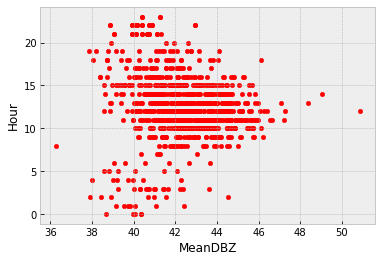

In [387]:
 ## Mean Reflectivity  value tracking from the radar 
storms.plot.scatter(x="MeanDBZ", y="Hour", color="red" );

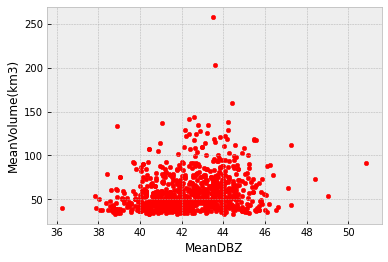

In [388]:

# radar Climo  volume  vs Reflectivity from 1-30 november 2021
storms.plot.scatter(x="MeanDBZ", y="MeanVolume(km3)", color="red");

<AxesSubplot:ylabel='Frequency'>

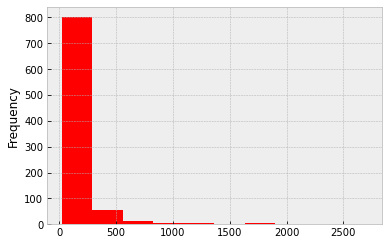

In [389]:
storms["SwathAreaEllipse(km2)"].plot(kind ="hist",color="Red")

<AxesSubplot:xlabel='FAR'>

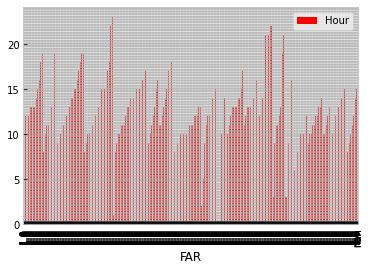

In [390]:
storms.plot(kind="bar",x='FAR', y='Hour', color='red')

storms.plot(kind='hist',x='MaxDBZ',y='Nscans')



In [391]:
##What is the average DBZ of the STORMS
storms["MaxDBZ"].mean()

53.85506200676438

In [392]:
##  the aggregating statistic can be calculated for multiple columns at the same time.
## Summary statistics

storms[["MeanDBZ", "MaxDBZ","MeanSpeed(km/hr)","RadarEstRainVol(m3)"]].describe()

,MeanDBZ,MaxDBZ,MeanSpeed(km/hr),RadarEstRainVol(m3)
count,887.000000,887.000000,887.000000,8.870000e+02
mean,42.390621,53.855062,13.612455,8.579479e+05
std,1.793632,3.998679,8.141285,2.090039e+06
min,36.252500,38.580000,0.247099,4.337460e+04
25%,41.125700,51.035000,8.156555,1.976530e+05
50%,42.365700,54.160000,12.175300,3.403850e+05
75%,43.660450,56.855000,17.378200,6.969830e+05
max,50.875200,63.440000,79.936900,2.690000e+07


<AxesSubplot:ylabel='Frequency'>

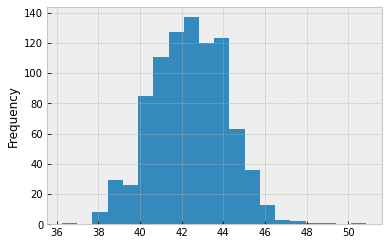

In [393]:
storms["MeanDBZ"].plot.hist(bins=20)

<AxesSubplot:xlabel='Duration(hours)', ylabel='MaxDBZ'>

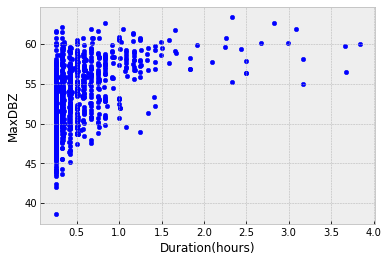

In [394]:
storms.plot.scatter(x="Duration(hours)", y="MaxDBZ")

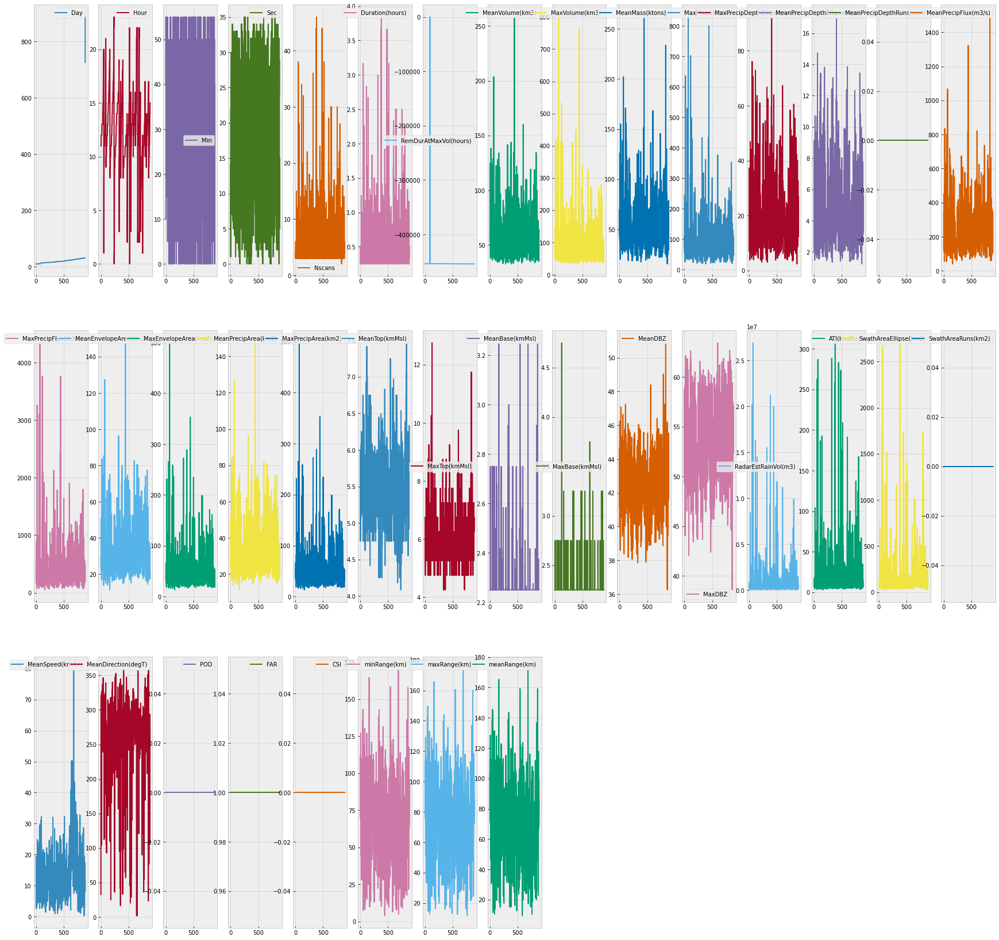

In [395]:
storms.plot(subplots=True, layout=(4, 15), figsize=(30, 40), sharex=False);

<AxesSubplot:xlabel='Day', ylabel='MaxDBZ'>

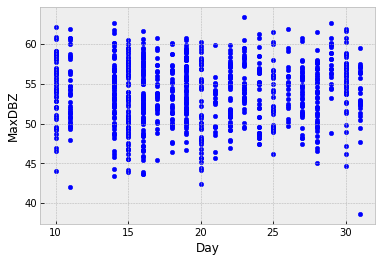

In [344]:
##Maximum DBZ plot for 1 November 2021

storms.plot.scatter(x="Day", y="MaxDBZ" )

<AxesSubplot:xlabel='Day', ylabel='MeanDBZ'>

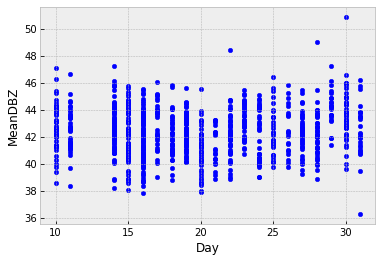

In [345]:
storms.plot.scatter(x="Day", y="MeanDBZ")

In [346]:
storms['RadarEstRainVol(m3)']

0      189658.0  
1      488607.0  
2      128777.0  
3      328606.0  
4      814637.0  
5      592476.0  
6      179281.0  
7      609649.0  
8      290307.0  
9      193872.0  
10     189108.0  
11     358967.0  
12     60055.5   
13     145611.0  
14     299909.0  
15     1010000.0 
16     224819.0  
17     543382.0  
18     113377.0  
19     8420000.0 
20     563608.0  
21     418295.0  
22     445753.0  
23     1470000.0 
24     814894.0  
25     838129.0  
26     199312.0  
27     309629.0  
28     344123.0  
29     285297.0  
30     552613.0  
31     1640000.0 
32     1640000.0 
33     414803.0  
34     320227.0  
35     131566.0  
36     1100000.0 
37     209728.0  
38     538551.0  
39     2730000.0 
40     238007.0  
41     228163.0  
42     145683.0  
43     806597.0  
44     668168.0  
45     93171.5   
46     155675.0  
47     1590000.0 
48     155130.0  
49     58780.3   
50     265772.0  
51     265138.0  
52     15500000.0
53     20200000.0
54     617294.0  
55     775

<AxesSubplot:xlabel='Day', ylabel='RadarEstRainVol(m3)'>

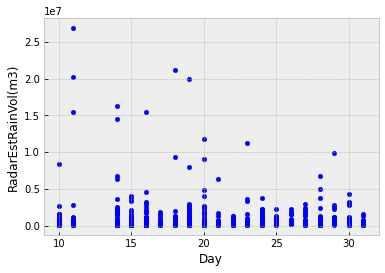

In [347]:
storms.plot.scatter(x="Day", y="RadarEstRainVol(m3)")

<AxesSubplot:ylabel='Frequency'>

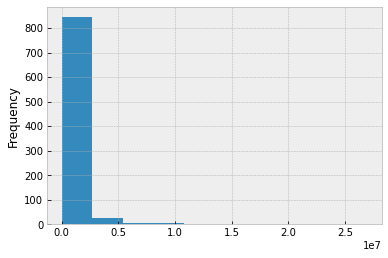

In [348]:
storms["RadarEstRainVol(m3)"].plot.hist()

In [349]:
storms["MeanPrecipArea(km2)"]


0      23.9375 
1      29.0000 
2      26.5000 
3      50.6667 
4      39.7500 
5      30.3333 
6      23.7500 
7      38.0500 
8      21.2500 
9      25.3500 
10     22.0000 
11     28.6250 
12     16.6667 
13     20.6667 
14     25.0500 
15     42.2143 
16     29.2500 
17     54.4167 
18     22.3333 
19     83.5089 
20     41.8750 
21     45.0000 
22     30.9375 
23     67.4643 
24     35.4375 
25     40.3333 
26     22.1250 
27     30.6500 
28     28.7083 
29     33.3750 
30     26.9583 
31     67.8889 
32     39.6591 
33     40.3500 
34     35.1667 
35     25.0833 
36     36.6875 
37     40.1667 
38     73.0833 
39     75.0000 
40     26.6250 
41     19.0000 
42     17.1875 
43     35.4318 
44     30.1250 
45     15.7500 
46     21.8500 
47     43.7500 
48     16.3750 
49     13.5000 
50     35.8333 
51     28.5000 
52     77.9488 
53     85.1286 
54     44.6250 
55     38.3929 
56     36.4808 
57     24.1667 
58     19.8750 
59     17.0000 
60     22.3333 
61     27.0000 
62     4

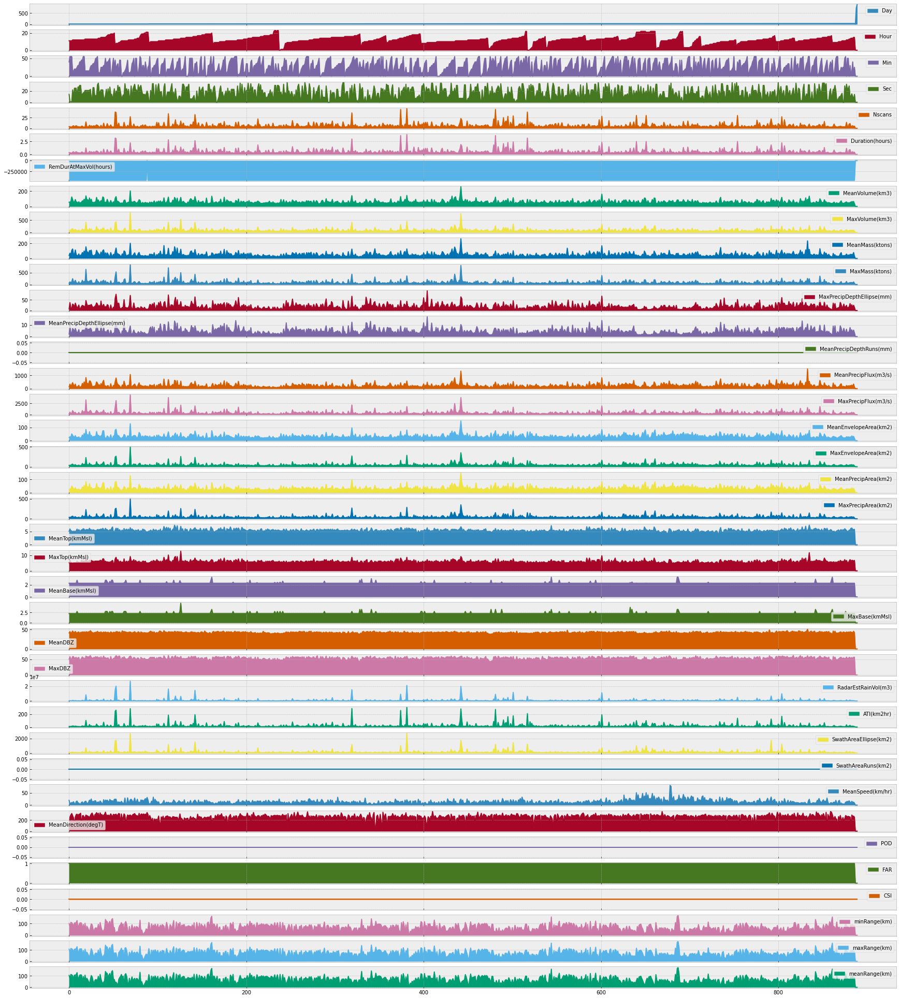

In [350]:
axs = storms.plot.area(figsize=(30, 35), subplots=True)

In [351]:
storms=pd.read_csv("C:/Users/METEO/Desktop/datasets/01_30october2021_storm_output.csv")
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
storms

C:\Users\METEO\AppData\Local\Temp/ipykernel_15492/2228818249.py:5: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,Year,Month,Day,Hour,Min,Sec,Nscans,Duration(hours),RemDurAtMaxVol(hours),MeanVolume(km3),MaxVolume(km3),MeanMass(ktons),MaxMass(ktons),MaxPrecipDepthEllipse(mm),MeanPrecipDepthEllipse(mm),MeanPrecipDepthRuns(mm),MeanPrecipFlux(m3/s),MaxPrecipFlux(m3/s),MeanEnvelopeArea(km2),MaxEnvelopeArea(km2),MeanPrecipArea(km2),MaxPrecipArea(km2),MeanTop(kmMsl),MaxTop(kmMsl),MeanBase(kmMsl),MaxBase(kmMsl),MeanDBZ,MaxDBZ,RadarEstRainVol(m3),ATI(km2hr),SwathAreaEllipse(km2),SwathAreaRuns(km2),MeanSpeed(km/hr),MeanDirection(degT),POD,FAR,CSI,minRange(km),maxRange(km),meanRange(km)
0,2021,10,10.0,11.0,40.0,14.0,4.0,0.328611,-453852.0,54.5938,78.250,40.6447,55.9236,7.16081,2.08647,0.0,131.7070,185.4500,23.9375,34.50,23.9375,34.50,5.12500,5.25,2.25000,2.25,41.2253,50.57,189658.0,7.86613,95.50,0.0,19.403700,32.61290,0.0,1.0,0.0,100.31700,107.0670,104.03800
1,2021,10,10.0,11.0,55.0,1.0,4.0,0.341111,-453852.0,56.5000,71.375,70.0940,109.7660,37.30650,9.12064,0.0,339.3100,546.5730,29.0000,37.75,29.0000,37.75,6.00000,6.75,2.25000,2.25,44.6836,58.74,488607.0,9.89222,53.00,0.0,2.675420,259.12000,0.0,1.0,0.0,78.11940,79.7506,78.96190
2,2021,10,10.0,11.0,55.0,1.0,3.0,0.251389,-453852.0,65.2917,92.875,44.6402,71.2088,7.22498,2.48841,0.0,119.2380,196.2970,26.5000,38.00,26.5000,38.00,5.25000,5.25,2.25000,2.25,39.9755,49.32,128777.0,6.66181,54.25,0.0,8.924400,296.14100,0.0,1.0,0.0,111.56700,113.4530,112.50500
3,2021,10,10.0,11.0,55.0,1.0,3.0,0.251389,-453852.0,124.4170,132.000,107.9460,115.4350,11.61510,3.00944,0.0,304.2650,316.3240,50.6667,56.50,50.6667,56.50,5.25000,5.25,2.25000,2.25,42.6754,51.99,328606.0,12.73700,108.25,0.0,10.239100,321.03600,0.0,1.0,0.0,108.12700,110.4950,109.29400
4,2021,10,10.0,12.0,10.0,22.0,5.0,0.418333,-453852.0,88.6000,151.875,126.0690,245.2290,30.28780,6.95712,0.0,452.5760,892.7800,39.7500,66.25,39.7500,66.25,4.75000,4.75,2.25000,2.25,46.2418,58.95,814637.0,16.62880,114.75,0.0,9.971130,280.12100,0.0,1.0,0.0,98.06070,103.2810,100.20300
5,2021,10,10.0,12.0,15.0,7.0,6.0,0.507778,-453852.0,56.5208,83.875,54.7427,97.9021,26.47080,6.00216,0.0,274.2950,568.5740,30.3333,41.00,30.3333,41.00,5.16667,5.25,2.25000,2.25,42.6670,59.02,592476.0,15.40260,94.50,0.0,13.610000,241.77700,0.0,1.0,0.0,69.34200,75.5935,71.94210
6,2021,10,10.0,12.0,20.0,25.0,3.0,0.250833,-453852.0,53.4583,80.750,49.6595,95.7109,11.65500,3.67594,0.0,166.0010,344.6020,23.7500,37.75,23.7500,37.75,5.08333,5.25,2.25000,2.25,42.0645,52.79,179281.0,5.95729,51.00,0.0,6.957560,112.08600,0.0,1.0,0.0,106.39800,106.8880,106.69400
7,2021,10,10.0,12.0,20.0,25.0,5.0,0.418333,-453852.0,89.8250,125.625,113.0400,177.2700,34.71780,7.03588,0.0,338.6940,511.5770,38.0500,54.00,38.0500,54.00,5.05000,5.25,2.25000,2.25,45.2227,55.00,609649.0,15.91760,91.50,0.0,2.668090,255.93500,0.0,1.0,0.0,104.87800,107.1080,106.14300
8,2021,10,10.0,12.0,20.0,25.0,6.0,0.496389,-453853.0,57.5417,70.625,51.6451,86.4980,22.51550,4.78049,0.0,134.4020,227.0520,21.2500,26.50,21.2500,26.50,5.25000,5.25,2.25000,2.25,42.0786,56.83,290307.0,10.54830,67.00,0.0,14.083400,300.71000,0.0,1.0,0.0,110.42900,112.0530,111.12800
9,2021,10,10.0,12.0,25.0,9.0,5.0,0.418333,-453853.0,56.4250,84.750,37.0882,53.5925,11.05270,2.61565,0.0,107.7070,149.1610,25.3500,34.00,25.3500,34.00,5.95000,6.25,2.75000,2.75,40.2726,48.70,193872.0,10.60480,81.00,0.0,16.493900,308.37900,0.0,1.0,0.0,127.24900,129.2560,128.53500


In [352]:
### Count of null values in each column of the data sets.
stormsdf.isnull().sum()

Year                          0
Month                         0
Day                           1
Hour                          3
Min                           3
Sec                           3
Nscans                        3
Duration(hours)               3
RemDurAtMaxVol(hours)         3
MeanVolume(km3)               3
MaxVolume(km3)                3
MeanMass(ktons)               3
MaxMass(ktons)                3
MaxPrecipDepthEllipse(mm)     3
MeanPrecipDepthEllipse(mm)    3
MeanPrecipDepthRuns(mm)       3
MeanPrecipFlux(m3/s)          3
MaxPrecipFlux(m3/s)           3
MeanEnvelopeArea(km2)         3
MaxEnvelopeArea(km2)          3
MeanPrecipArea(km2)           3
MaxPrecipArea(km2)            3
MeanTop(kmMsl)                3
MaxTop(kmMsl)                 3
MeanBase(kmMsl)               3
MaxBase(kmMsl)                3
MeanDBZ                       3
MaxDBZ                        3
RadarEstRainVol(m3)           3
ATI(km2hr)                    3
SwathAreaEllipse(km2)         3
SwathAre

<AxesSubplot:ylabel='Frequency'>

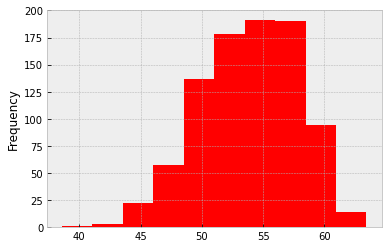

In [353]:
storms["MaxDBZ"].plot(kind="hist" ,color="red")

<AxesSubplot:xlabel='Day', ylabel='MaxDBZ'>

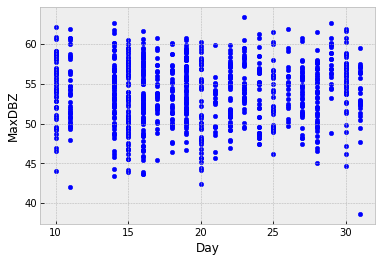

In [354]:
##Maximum DBZ plot for 1 october 2021

storms.plot.scatter(x="Day", y="MaxDBZ" )

<AxesSubplot:xlabel='Day', ylabel='RadarEstRainVol(m3)'>

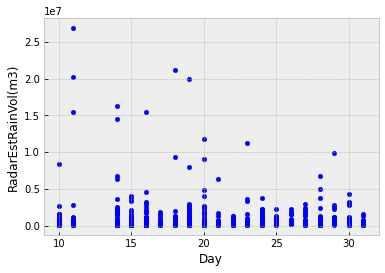

In [355]:
#octobersad
storms.plot.scatter(x="Day", y="RadarEstRainVol(m3)")

<AxesSubplot:ylabel='Frequency'>

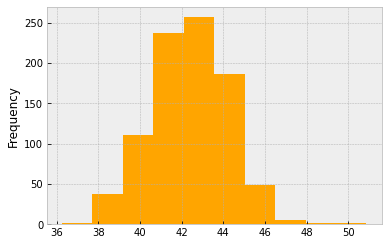

In [356]:
storms["MeanDBZ"].plot.hist(color="orange")

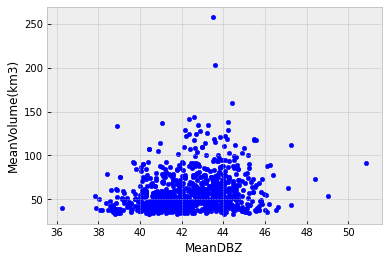

In [357]:
# radar Climo  volume  vs Reflectivity from 1-30 OCTOBER 2021
storms.plot.scatter(x="MeanDBZ", y="MeanVolume(km3)", color="blue");

In [358]:
##What is the average DBZ of the STORMS
storms["MaxDBZ"].mean()

53.85506200676438

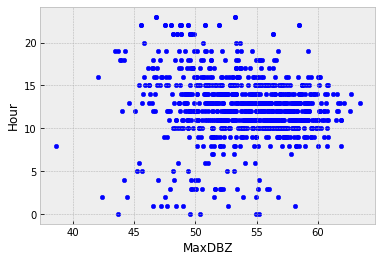

In [359]:
storms.plot(x="MaxDBZ", y="Hour", kind="scatter");

In [405]:
plt.plot(storms["MaxDBZ"])



Lines(colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'], interactions={'hover': 'tooltip'}, scales={'x': LinearScale(), 'y': LinearScale()}, scales_metadata={'x': {'orientation': 'horizontal', 'dimension': 'x'}, 'y': {'orientation': 'vertical', 'dimension': 'y'}, 'color': {'dimension': 'color'}}, tooltip_style={'opacity': 0.9}, x=array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 10